# Part 1 -Static Data Analysis

### Read Sub Demographic Data

In [0]:
from pyspark.sql.types import *
from pyspark import SparkContext
from pyspark.sql import SparkSession
from pyspark.sql.types import ArrayType, DoubleType, FloatType
from pyspark.sql.functions import udf
import pyspark.sql.functions as F
from pyspark.ml import Pipeline
from pyspark.ml.linalg import Vectors, VectorUDT, DenseVector,Vector
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, MaxAbsScaler,PCA
import matplotlib.pyplot as plt
from pyspark.ml.clustering import KMeans
from pyspark.sql.window import Window

spark = SparkSession.builder.appName("my project 2")\
    .config("spark.kryoserializer.buffer.max", "512m")\
    .config('spark.jars.packages', 'org.apache.spark:spark-sql-kafka-0-10_2.12:3.2.0')\
        .getOrCreate()
sc = spark.sparkContext


for_students_demo_path = "/mnt/ddscoursedatastorage/ro/fwm-stb-data/proj_B_demographic"
demographic_df = spark.read.parquet(for_students_demo_path)
display(demographic_df)

household_id,household_size,num_adults,num_generations,marital_status,race_code,dwelling_type,home_owner_status,length_residence,home_market_value,net_worth,gender_individual,education_highest
85,2,1,2,B,W,S,O,15,0.125,0.05,F,1
2073,1,1,2,M,H,S,O,15,0.15,0.1,F,1
2523,7,6,3,M,W,S,O,15,0.1,0.1,M,2
2717,3,2,2,S,W,S,O,11,0.125,0.2,M,3
3364,2,2,2,M,W,S,O,15,0.1,0.1,M,1
4046,4,3,3,M,W,S,O,6,0.075,0.05,F,1
4303,1,1,1,S,W,S,O,15,0.15,0.2,M,1
4559,3,2,2,S,W,S,O,12,0.175,0.2,F,2
5277,3,2,2,M,W,S,R,15,0.125,0.02,M,2
5440,1,1,1,S,W,S,O,8,0.225,0.2,F,1


## Read Static viewing data from Kafka

In [0]:

kafka_server = "kafka96224.eastus.cloudapp.azure.com:29092" 
topic='viewstatic'
OFFSETS_PER_TRIGGER = 50000
SCHEMA = "device_id STRING, event_date STRING, event_time STRING, station_num STRING, prog_code STRING, household_id LONG"

static_df = spark.read\
                  .format("kafka")\
                  .option("kafka.bootstrap.servers", kafka_server)\
                  .option("subscribe", topic)\
                  .option("startingOffsets", "earliest")\
                  .option("failOnDataLoss",False)\
                  .load()

static_view_data = static_df.select(F.from_csv(F.decode("value", "US-ASCII"), schema=SCHEMA).alias("value")).select("value.*").na.drop()
display(static_view_data)

device_id,event_date,event_time,station_num,prog_code,household_id
000000033449,20150114,000000,59444,MV000963020000,1496400
000000033633,20150114,000000,16374,EP018001900333,1477911
0000000792ce,20150114,000000,60179,EP018001900333,1464390
00000007a06a,20150114,000000,19746,SH000299490000,1491604
00000007a196,20150114,000000,61812,EP002654380201,1468157
00000007a236,20150114,000000,11207,EP003169780032,3250955
0000000a0707,20150114,000000,79051,EP006331691288,1462990
0000000cb631,20150114,000000,21247,EP005927330074,1478303
0000000dee65,20150114,000000,10142,EP003118650048,1492519
0000000e5290,20150114,000000,11066,EP000548690053,1479402


##Feature Extraction

In [0]:
# GPT assistance
# create a df with the categorical columns vector
cat_cols = ['marital_status', 'race_code', 'dwelling_type', 'home_owner_status', 'gender_individual']
dem_cat_df = demographic_df.select('household_id',*cat_cols)
# Initialize a VectorAssembler with empty inputCols and the outputCol as "combined_features"
assembler = VectorAssembler(inputCols=[], outputCol="combined_categorical_features")
for col in cat_cols:
    # Apply StringIndexer to index the categorical column
    indexer = StringIndexer(inputCol=col, outputCol=col + "_Index")
    # Apply OneHotEncoder to one-hot encode the indexed column
    encoder = OneHotEncoder(inputCols=[col + "_Index"], outputCols=["encoded_" + col])
    # Add the encoded column to the inputCols of the VectorAssembler
    assembler.setInputCols(assembler.getInputCols() + ["encoded_" + col])
    # Create a pipeline with StringIndexer and OneHotEncoder
    pipeline = Pipeline(stages=[indexer, encoder])
    # Fit the pipeline to the DataFrame and transform the DataFrame
    dem_cat_df = pipeline.fit(dem_cat_df).transform(dem_cat_df)
# Apply the VectorAssembler to concatenate all the encoded columns into a single column
dem_cat_df = assembler.transform(dem_cat_df).select("household_id","combined_categorical_features")


In [0]:
# create a df with the categorical columns vector
demographic_df = demographic_df.withColumn('education_highest', F.col('education_highest').cast('double'))
numerical_cols = ['household_size', 'num_adults', 'num_generations', 'length_residence', 'home_market_value', 'net_worth', 'education_highest']

dem_numerical_df = demographic_df.select('household_id',*numerical_cols)
assembler = VectorAssembler(inputCols=numerical_cols, outputCol="features")
dem_numerical_df = assembler.transform(dem_numerical_df)
# Create an instance of MinMaxScaler
scaler = MaxAbsScaler(inputCol="features", outputCol="combined_numerical_features")
# Fit the scaler to the DataFrame and transform
dem_numerical_df = scaler.fit(dem_numerical_df).transform(dem_numerical_df).select("household_id","combined_numerical_features")

In [0]:
# GPT assistance
# Join the DataFrames and select the household_id column along with the struct arrays
df = dem_numerical_df.join(dem_cat_df, "household_id")

# Define UDF to convert UDT to a compatible type
udf_convert_udt = udf(lambda x: x.toArray().tolist(), ArrayType(DoubleType()))

# Convert UDT columns to compatible type
df = df.withColumn("converted_categorical_features", udf_convert_udt(F.col("combined_categorical_features")))
df = df.withColumn("converted_numerical_features", udf_convert_udt(F.col("combined_numerical_features")))

# Concatenate the struct arrays using the concat function
df = df.withColumn("concatenated_vector", F.concat(F.col("converted_numerical_features"),F.col("converted_categorical_features")))

# Define UDF to convert the concatenated array to a dense vector
udf_array_to_vector = F.udf(lambda arr: Vectors.dense(arr), VectorUDT())

# Convert the concatenated array to a dense vector
df = df.withColumn("features", udf_array_to_vector(F.col("concatenated_vector")))
# select and display
feature_vec_df=df.select("household_id", "features")
feature_vec_df.show(7, truncate=False)


+------------+--------------------------------------------------------------------------------------------------------------------------------+
|household_id|features                                                                                                                        |
+------------+--------------------------------------------------------------------------------------------------------------------------------+
|85          |[0.2222222222222222,0.16666666666666666,0.6666666666666666,1.0,0.125,0.05,0.25,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0]             |
|2073        |[0.1111111111111111,0.16666666666666666,0.6666666666666666,1.0,0.15,0.1,0.25,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0]               |
|2523        |[0.7777777777777777,1.0,1.0,1.0,0.1,0.1,0.5,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0]                                                |
|2717        |[0.3333333333333333,0.3333333333333333,0.6666666666666666,0.7333333333333333,0.125,0.2,0.75,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.

##Visual Analysis

In [0]:
pca = PCA(k=2, inputCol="features", outputCol="pca_features")
model = pca.fit(feature_vec_df)
feature_vec_df = model.transform(feature_vec_df)\
                        .withColumn("pca_features", udf_convert_udt(F.col("pca_features")))

In [0]:
PCA_feature_vec_df= feature_vec_df.select('household_id','pca_features')
PCA_feature_vec_df.show(7,truncate=False)

+------------+--------------------------------------------+
|household_id|pca_features                                |
+------------+--------------------------------------------+
|85          |[-0.35625542326615856, -0.11097025338253685]|
|2073        |[-1.0925316168664254, 0.12397733233143077]  |
|2523        |[-1.4149098090986307, -0.970179836670209]   |
|2717        |[0.06329368821084108, -1.158369672110097]   |
|3364        |[-1.2929454215296108, -0.9714139901152655]  |
|4046        |[-1.1192228102668804, -0.006375350365083842]|
|4303        |[0.07476265653874331, -1.1529793790408365]  |
+------------+--------------------------------------------+
only showing top 7 rows



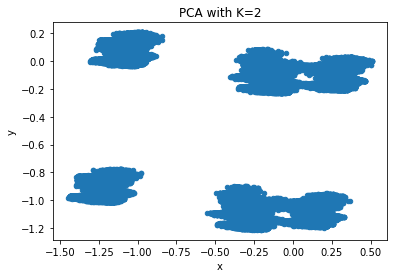

In [0]:
# Select the individual elements within the struct array
Coordinates = PCA_feature_vec_df.select(F.col("pca_features")[0].alias("x"), F.col("pca_features")[1].alias("y"))\
                                    .toPandas()\
                                        
# Plot the scatter plot using Pandas
Coordinates.plot.scatter(x="x", y="y")
plt.title('PCA with K=2')
# Display the plot
plt.show()


##Clustering

In [0]:
#
num_features = len(feature_vec_df.select("features").first()[0])
clustering_df = feature_vec_df.withColumn("features", udf_convert_udt(F.col("features")))
clustering_df = clustering_df.select(
    F.col('household_id'),
    *[F.col("features")[i].alias(f"x{i}") for i in range(num_features)]
)
cols=[f"x{i}" for i in range(num_features)]
assembler = VectorAssembler(inputCols=cols,outputCol='features_for_cluster')
clustering_df = assembler.transform(clustering_df)
for col in cols:
    clustering_df=clustering_df.drop(col).cache()

In [0]:
# kmeans_df = PCA_feature_vec_df.select(F.col('household_id'),F.col("pca_features")[0].alias("x"), F.col("pca_features")[1].alias("y"))
# assembler = VectorAssembler(inputCols=['x','y'],outputCol='features')
# kmeans_df = assembler.transform(kmeans_df).drop('x','y').cache()
kmeans = KMeans(k=6, featuresCol='features_for_cluster', predictionCol='cluster', seed=3)
# Fit the KMeans model to the input data
model = kmeans.fit(clustering_df)
predictions = model.transform(clustering_df)
cluster_centers =  model.clusterCenters()
# Define the UDF to map cluster ID to centroid coordinates
centroid_udf = udf(lambda cluster: cluster_centers[cluster].tolist(), ArrayType(FloatType()))
# Add a new column 'centroid_coordinates' using the UDF
predictions = predictions.withColumn('centroid_coordinates', centroid_udf('cluster'))
distance_udf = udf(lambda features, centroid_coordinates: \
                   float(Vectors.squared_distance(features, centroid_coordinates)),
                   FloatType())
predictions = predictions.withColumn('distance', \
    distance_udf(F.col('features_for_cluster'), F.col('centroid_coordinates'))).drop('centroid_coordinates')

# Show the resulting DataFrame
predictions.show(7,truncate=False)

+------------+--------------------------------------------------------------------------------------------------------------------------------+-------+----------+
|household_id|features_for_cluster                                                                                                            |cluster|distance  |
+------------+--------------------------------------------------------------------------------------------------------------------------------+-------+----------+
|85          |[0.2222222222222222,0.16666666666666666,0.6666666666666666,1.0,0.125,0.05,0.25,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0]             |0      |0.99734384|
|2073        |[0.1111111111111111,0.16666666666666666,0.6666666666666666,1.0,0.15,0.1,0.25,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0]               |3      |0.6960765 |
|2523        |[0.7777777777777777,1.0,1.0,1.0,0.1,0.1,0.5,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0]                                                |1      |0.81485933|
|2717        |[0.33333

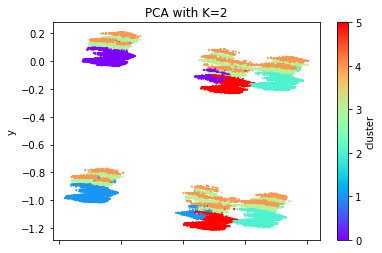

In [0]:
pred_clusters = predictions.select("household_id","cluster")
k_plots =  PCA_feature_vec_df.join(pred_clusters, on='household_id')\
                        .select(F.col("pca_features")[0].alias("x"), F.col("pca_features")[1].alias("y"),'cluster')\
                        .toPandas()
# k_plots = predictions.withColumn("features", udf_convert_udt(F.col("features")))\
#             .select(F.col('household_id'),F.col("features")[0].alias("x"), F.col("features")[1].alias("y"),F.col('cluster'))
k_plots.plot.scatter(x="x", y="y",s=1,c='cluster',cmap='rainbow')
plt.title('PCA with K=2')
# Display the plot
plt.show()

##Dividing households into subsets

In [0]:
window_spec = Window.partitionBy("cluster").orderBy(F.col("distance").asc())
ranked_df = predictions.withColumn("rank", F.row_number().over(window_spec))
third_subset = ranked_df.filter(F.col('rank')%3==0)
seventeenth_subset = ranked_df.filter(F.col('rank')%17==0)
ranked_df.write.mode('overwrite').parquet('ranked_df.parquet')
third_subset.write.mode('overwrite').parquet('third_subset.parquet')
seventeenth_subset.write.mode('overwrite').parquet('seventeenth_subset.parquet')

household_id,features_for_cluster,cluster,distance,rank
8972,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.7333333333333333, 0.15, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.034352075,17
3939052,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.8, 0.125, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.035196282,34
2814052,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.7333333333333333, 0.2, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.035979014,51
1465901,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.7333333333333333, 0.1, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.037725136,68
3802857,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.8, 0.225, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.038450163,85
2828482,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.5, 0.6666666666666666, 0.8, 0.175, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.038707823,102
1337137,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.5, 0.6666666666666666, 0.7333333333333333, 0.175, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.038925145,119
2851208,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.5, 0.6666666666666666, 0.8, 0.125, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.03958088,136
1926031,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.5, 0.6666666666666666, 0.7333333333333333, 0.2, 0.2, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.040363617,153
3175740,"Map(vectorType -> dense, length -> 16, values -> List(0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.8, 0.175, 0.1, 0.25, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0))",1,0.041903757,170


### saving our work, for convenience

In [0]:
ranked_df = spark.read.parquet('/ranked_df.parquet')
third_subset = spark.read.parquet('/third_subset.parquet')
seventeenth_subset = spark.read.parquet('/seventeenth_subset.parquet')

##Cluster’s Viewing Analysis

###Q1+Q2

In [0]:
seventeenth_joined=(seventeenth_subset.select("household_id","cluster")).join(static_view_data, on="household_id", how="inner")
seventeenth_joined.write.mode('overwrite').parquet('seventeenth_joined.parquet')

In [0]:
third_joined=(third_subset.select("household_id","cluster")).join(static_view_data, on="household_id", how="inner")
third_joined.write.mode('overwrite').parquet('third_joined.parquet')

In [0]:
ranked_df_joined=(ranked_df.select("household_id","cluster")).join(static_view_data, on="household_id", how="inner")
ranked_df_joined.write.mode('overwrite').parquet('ranked_df_joined.parquet')

In [0]:
ranked_df_joined = spark.read.parquet('/ranked_df_joined.parquet')
third_joined = spark.read.parquet('/third_joined.parquet')
seventeenth_joined = spark.read.parquet('/seventeenth_joined.parquet')

####Getting the popularity ratings for all, 3rd's and 17th's

In [0]:
window_spec=Window.partitionBy("cluster")
window_spec2=Window.partitionBy("cluster").orderBy(F.desc('popularity_rating'))
views_per_station17=seventeenth_joined.groupBy("cluster",'station_num').agg(F.count("*").alias("views_per_station"))
pop_rating_17 = views_per_station17.withColumn('views_per_cluster', F.sum("views_per_station").over(window_spec))\
                                .withColumn('popularity_rating', F.lit(100)*F.col('views_per_station')/F.col('views_per_cluster'))\
                                    .select('cluster','station_num', 'popularity_rating')\
                                        .withColumn('rank',  F.row_number().over(window_spec2))
display(pop_rating_17)

cluster,station_num,popularity_rating,rank
0,16374,1.632555334846765,1
0,14902,1.6228007945516458,2
0,60179,1.5358967082860386,3
0,11221,1.306221623155505,4
0,12131,1.306221623155505,5
0,14771,1.1865068104426788,6
0,11207,1.0437358115777526,7
0,74796,1.007377979568672,8
0,10171,0.9852085698070374,9
0,11187,0.9648127128263337,10


In [0]:
window_spec = Window.partitionBy("cluster")
window_spec2=Window.partitionBy("cluster").orderBy(F.desc('popularity_rating'))
views_per_station_third = third_joined.groupBy("cluster", "station_num").agg(F.count("*").alias("count_over_cluster"))
pop_rating_third = views_per_station_third.withColumn('views_per_cluster', F.sum('count_over_cluster').over(window_spec)) \
                                        .withColumn('popularity_rating', (F.col('count_over_cluster') / F.col('views_per_cluster')) * 100) \
                                             .select('cluster', 'station_num', 'popularity_rating')\
                                                    .withColumn('rank',  F.row_number().over(window_spec2))
display(pop_rating_third)


cluster,station_num,popularity_rating,rank
0,60179,1.731533905085839,1
0,16374,1.5867196840859514,2
0,14902,1.1988244492648243,3
0,14771,1.1747901562837508,4
0,32645,1.1007097722218333,5
0,11207,1.0996449617733048,6
0,49788,1.059942743621025,7
0,11221,1.023130725257608,8
0,12131,0.9876877488994424,9
0,11187,0.9654788452587033,10


In [0]:
window_spec=Window.partitionBy("cluster")
window_spec2=Window.partitionBy("cluster").orderBy(F.desc('popularity_rating'))
views_per_station_all=ranked_df_joined.groupBy("cluster",'station_num').agg(F.count("*").alias("views_per_station"))
pop_rating_all = views_per_station_all.withColumn('views_per_cluster', F.sum("views_per_station").over(window_spec))\
                                .withColumn('popularity_rating', 100*F.col('views_per_station')/F.col('views_per_cluster'))\
                                    .select('cluster','station_num', 'popularity_rating')\
                                        .withColumn('rank',  F.row_number().over(window_spec2))
display(pop_rating_all)

cluster,station_num,popularity_rating,rank
0,16374,1.6600458595129426,1
0,60179,1.567870106925949,2
0,14771,1.212142286975919,3
0,11207,1.1617466474703049,4
0,14902,1.157542685781371,5
0,49788,1.0761103908438752,6
0,32645,1.0468383613061139,7
0,11221,1.0282059878946663,8
0,12131,1.007705187065915,9
0,11187,0.9650946617990672,10


In [0]:
7

Out[57]: 7

###Q3

####Getting the popularity rating for all stations in  the full data

In [0]:
gen_pop_views_per_station=static_view_data.dropDuplicates().select("station_num")
gen_pop_views_per_station = static_view_data.groupBy('station_num').agg(F.count('*').alias('views per station'))
all_views = gen_pop_views_per_station.agg(F.sum("views per station")).collect()[0][0]
gen_pop_rating = gen_pop_views_per_station.withColumn('gen pop station rating', 100*F.col('views per station')/F.lit(all_views))\
                                                .select('station_num','gen pop station rating')
gen_pop_views_per_station.show(5, truncate=False)
gen_pop_rating.write.mode('overwrite').parquet('gen_pop_rating.parquet')

+-----------+-----------------+
|station_num|views per station|
+-----------+-----------------+
|65348      |718              |
|14899      |11223            |
|18726      |110              |
|45540      |811              |
|12394      |4498             |
+-----------+-----------------+
only showing top 5 rows



###Q4

####Joining each subset df with the Gen-Pop df to get the diff-rank

In [0]:
gen_pop_rating = spark.read.parquet('/gen_pop_rating.parquet')

#####All - All Clusters

In [0]:
pop_rating_all_with_gen=pop_rating_all.join(gen_pop_rating, on="station_num", how="inner")
pop_rating_all_with_gen=pop_rating_all_with_gen.withColumn("diff_rank", F.col("popularity_rating")-F.col("gen pop station rating")).drop("popularity_rating","gen pop station rating","rank")

#####17th's -  All Clusters

In [0]:
pop_rating_17_with_gen=pop_rating_17.join(gen_pop_rating, on="station_num", how="inner")
pop_rating_17_with_gen=pop_rating_17_with_gen.withColumn("diff_rank", F.col("popularity_rating")-F.col("gen pop station rating")).drop("popularity_rating","gen pop station rating","rank")
pop_rating_17_with_gen.show()


+-----------+-------+--------------------+
|station_num|cluster|           diff_rank|
+-----------+-------+--------------------+
|      17561|      0|-0.01014024842534...|
|      58623|      0|0.046221317774797044|
|      19548|      0|-0.02032718710020...|
|      11115|      0| 0.01952854285105822|
|      21722|      0|0.012879254591467864|
|      80740|      0|0.004272906657443113|
|      63138|      0|0.009076319766946027|
|      14752|      0|0.018816862108918645|
|      10002|      0|7.090097884506572E-4|
|      11309|      0|-7.73074495949684...|
|      10431|      0|-2.05455341267511...|
|      77361|      0|0.003700775879433...|
|      51464|      0|0.025943335961671452|
|      14753|      0|-0.01268082824369...|
|      82570|      0|-0.00540636433101...|
|      15090|      0|-0.01126354540117147|
|      12435|      0|0.004548320581218732|
|      21915|      0|-0.00760114207574...|
|      32569|      0|0.025769099448017238|
|      16376|      0|-0.01540067931603...|
+----------

#####3rd's - All Clusters

In [0]:
pop_rating_third_with_gen=pop_rating_third.join(gen_pop_rating, on="station_num", how="inner")
pop_rating_third_with_gen = pop_rating_third_with_gen.withColumn("diff_rank", F.col("popularity_rating")-F.col("gen pop station rating")).drop("popularity_rating","gen pop station rating","rank")

## Displaying the  top-7 highest ’diff rank’ stations per cluster

In [0]:
window_spec3=Window.partitionBy("cluster").orderBy(F.desc('diff_rank'))

top_7_diff_rank_17 = pop_rating_17_with_gen.withColumn("rank", F.row_number().over(window_spec3)) \
                                                         .filter(F.col("rank") <= 7)\
                                                             .withColumnRenamed("station_num","station_num_17th")\
                                                                 .withColumnRenamed("diff_rank","diff_rank_17th")
top_7_diff_rank_3 = pop_rating_third_with_gen.withColumn("rank", F.row_number().over(window_spec3)) \
                                                         .filter(F.col("rank") <= 7)\
                                                             .withColumnRenamed("station_num","station_num_3rd")\
                                                                 .withColumnRenamed("diff_rank","diff_rank_3rd")
top_7_diff_rank_All = pop_rating_all_with_gen.withColumn("rank", F.row_number().over(window_spec3)) \
                                                         .filter(F.col("rank") <= 7)\
                                                             .withColumnRenamed("station_num","station_num_all")\
                                                                 .withColumnRenamed("diff_rank","diff_rank_all")

In [0]:
joined_top_7 = top_7_diff_rank_All.join(top_7_diff_rank_17, on=["cluster","rank"], how="left")\
                                    .join(top_7_diff_rank_3, on=["cluster","rank"], how="left")
display(joined_top_7)

cluster,rank,station_num_all,diff_rank_all,station_num_17th,diff_rank_17th,station_num_3rd,diff_rank_3rd
0,1,16374,0.15923312579402515,14902,0.5762356726443569,60179,0.3120845316612417
0,2,60179,0.14842073350135188,11221,0.38810456264190385,74796,0.187341948754024
0,3,14902,0.1109775638740822,74796,0.3145780347246405,14902,0.15225932735753545
0,4,11221,0.11008892738106513,11066,0.2611963244651673,61522,0.12606560280895185
0,5,49788,0.10625692103643791,12131,0.20879228724084276,11221,0.10501366474400686
0,6,61522,0.10264767102404004,12574,0.2032162580533473,31709,0.09576682921384536
0,7,11069,0.08976342159548512,10335,0.19399937327147634,49788,0.09008927381358767
1,1,60179,0.2722119018380882,60179,0.28318345927220134,60179,0.32257744656100207
1,2,16374,0.16436943002324855,11150,0.23035366343074815,16374,0.2489287571344605
1,3,19606,0.1553240200859785,14771,0.22326024924993293,19606,0.2025864545007845


#Part 2 - Dynamic Data Analysis

## Read Streaming viewing data from Kafka

In [0]:
topic = "viewstream" 
streaming_df = spark.readStream\
                  .format("kafka")\
                  .option("kafka.bootstrap.servers", kafka_server)\
                  .option("subscribe", topic)\
                  .option("startingOffsets", "earliest")\
                  .option("failOnDataLoss",False)\
                  .option("maxOffsetsPerTrigger", OFFSETS_PER_TRIGGER )\
                  .load()\
                  .select(F.from_csv(F.decode("value", "US-ASCII"), schema=SCHEMA).alias("value")).select("value.*")

In [0]:
num_processed = 0
window_spec = Window.partitionBy("cluster")
window_spec2=Window.partitionBy("cluster").orderBy(F.desc('popularity_rating'))
window_spec3=Window.partitionBy("cluster").orderBy(F.desc('diff_rank'))
third_subset = spark.read.parquet('/third_subset.parquet').select('household_id','cluster')
def handle_batch(trigger_df, epoch_num):
    global num_processed
    print(f'$$$$$$$$$$$$$$$$---------{epoch_num}---------$$$$$$$$$$$$$$$$$$$$$$')
    if num_processed == 5:
        query.stop()
        return

    batch_size = trigger_df.count()
    if batch_size == 0:
        print(f"NOTHING to process in epoch {epoch_num}")
        return

    num_processed += 1
    if num_processed != 1:
        prev_trigger = spark.read.parquet(f'/batch_{num_processed - 1}')
        acc_df = prev_trigger.union(trigger_df)
    else:
        acc_df = trigger_df

    acc_df.write.mode('overwrite').parquet(f'batch_{num_processed}')
    joined_batch = third_subset.join(acc_df, how='inner', on='household_id')

    views_per_station_third = joined_batch.groupBy("cluster", "station_num") \
        .agg(F.count("*").alias("count_over_cluster"))
    pop_rating_third = views_per_station_third.withColumn('views_per_cluster', F.sum('count_over_cluster').over(window_spec)) \
        .withColumn('popularity_rating', (F.col('count_over_cluster') / F.col('views_per_cluster')) * 100) \
        .select('cluster', 'station_num', 'popularity_rating')

    gen_pop_views_per_station = acc_df.groupBy('station_num').agg(F.count('*').alias('views_per_station'))
    gen_pop_N = gen_pop_views_per_station.agg(F.sum("views_per_station")).collect()[0][0]
    gen_pop_rating = gen_pop_views_per_station.withColumn('gen_pop_station_rating',
                                                          100 * F.col('views_per_station') / F.lit(gen_pop_N)) \
        .select('station_num', 'gen_pop_station_rating')
    pop_rating_third_with_gen=pop_rating_third.join(gen_pop_rating, on="station_num", how="inner")
    pop_rating_third_with_gen = pop_rating_third_with_gen.withColumn("diff_rank", F.col("popularity_rating")-F.col("gen_pop_station_rating")).drop("popularity_rating","gen_pop_station_rating","rank")
    top_7_diff_rank_3 = pop_rating_third_with_gen.withColumn("rank", F.row_number().over(window_spec3)) \
                                                            .filter(F.col("rank") <= 7)\
                                                                .withColumnRenamed("station_num","station")\
                                                                    .withColumnRenamed("diff_rank","diff_rank for third cluster")
    top_7_diff_rank_3.show(42)


As you can see our implementation is very naive and relies on accumulating the data and recalculating the scores each stream. we realize this is not feasible in the long run. However, in this case we're dealing with a relatively small amount of data, i.e a small amount of batches, so we chose the simple way of dealing with it. 
in case of a larger amount of batches, we would maintain a intemediate DataFrame that would help speed up the proccess for each batch.

In [0]:
query = streaming_df.writeStream\
                    .format('memory')\
                    .foreachBatch(handle_batch)\
                    .start()

# Output for 5 triggers

In [0]:
$$$$$$$$$$$$$$$$---------0---------$$$$$$$$$$$$$$$$$$$$$$
+-------+-------+---------------------------+----+
|station|cluster|diff_rank for third cluster|rank|
+-------+-------+---------------------------+----+
|  32645|      0|         0.5663073526164712|   1|
|  11164|      0|          0.418875689997792|   2|
|  74796|      0|           0.35927710311327|   3|
|  10021|      0|        0.34231618458820934|   4|
|  14902|      0|        0.33247604327666147|   5|
|  60179|      0|        0.33151512475160083|   6|
|  11221|      0|        0.31047604327666145|   7|
|  32645|      1|         0.3422020444978955|   1|
|  56905|      1|        0.33798436560432965|   2|
|  19606|      1|         0.3308819402685909|   3|
|  57708|      1|        0.26349929845660464|   4|
|  11661|      1|        0.24670555221487273|   5|
|  58646|      1|          0.245852074564041|   6|
|  45507|      1|        0.23380797755061145|   7|
|  14771|      2|        0.35353958749168335|   1|
|  16615|      2|         0.3341383898868927|   2|
|  61522|      2|         0.3109367930805056|   3|
|  99995|      2|        0.30447238855622105|   4|
|  11865|      2|         0.3015355954757153|   5|
|  16409|      2|         0.2666027944111777|   6|
|  12131|      2|         0.2512707917498336|   7|
|  11118|      3|         1.8721290322580646|   1|
|  58574|      3|         1.4589354838709676|   2|
|  64490|      3|          0.872483870967742|   3|
|  10222|      3|         0.8552580645161291|   4|
|  21883|      3|         0.8248709677419355|   5|
|  59684|      3|         0.6908709677419356|   6|
|  65732|      3|         0.6580645161290323|   7|
|  10171|      4|         1.6332320217096334|   1|
|  14765|      4|         1.1799077340569877|   2|
|  35513|      4|         1.1168521031207599|   3|
|  70387|      4|         0.9808521031207599|   4|
|  11561|      4|         0.9311668928086838|   5|
|  12131|      4|         0.9160651289009496|   6|
|  44940|      4|         0.8973242876526457|   7|
|  51529|      5|         0.4568937329700271|   1|
|  10179|      5|        0.41481198910081707|   2|
|  16616|      5|         0.4079509536784741|   3|
|  64241|      5|         0.3854550408719346|   4|
|  58515|      5|        0.35193460490463213|   5|
|  21214|      5|         0.3459673024523161|   6|
|  57394|      5|        0.29095912806539503|   7|
+-------+-------+---------------------------+----+

$$$$$$$$$$$$$$$$---------1---------$$$$$$$$$$$$$$$$$$$$$$

+-------+-------+---------------------------+----+
|station|cluster|diff_rank for third cluster|rank|
+-------+-------+---------------------------+----+
|  32645|      0|         0.3870944282837323|   1|
|  10021|      0|        0.27774848959498777|   2|
|  16615|      0|         0.2465603043186395|   3|
|  11221|      0|        0.22899574848959492|   4|
|  14902|      0|         0.2283130454240322|   5|
|  60179|      0|        0.21658223316178127|   6|
|  58646|      0|        0.20458223316178126|   7|
|  11661|      1|         0.3249850905218318|   1|
|  11713|      1|         0.2454294704230806|   2|
|  36069|      1|        0.23083686707328877|   3|
|  60179|      1|         0.2294071062058285|   4|
|  10179|      1|         0.2283033207474101|   5|
|  20288|      1|        0.20744437990124887|   6|
|  57391|      1|         0.1956146771226644|   7|
|  10142|      2|         0.4672889561270801|   1|
|  16615|      2|        0.25376332156664994|   2|
|  10918|      2|        0.24666784333501435|   3|
|  16123|      2|         0.2420959825180703|   4|
|  10510|      2|        0.21381005210959828|   5|
|  10402|      2|        0.20861959993276186|   6|
|  10518|      2|        0.20685779122541603|   7|
|  19320|      3|         1.9479262493934983|   1|
|  11118|      3|         1.5562047549733138|   2|
|  51529|      3|         0.8561242115477924|   3|
|  58574|      3|         0.7440436681222707|   4|
|  10222|      3|         0.6678020378457059|   5|
|  10171|      3|         0.5216443474041728|   6|
|  44714|      3|         0.5107214944201844|   7|
|  10171|      4|         1.1746328469630136|   1|
|  35513|      4|         1.0305812690872072|   2|
|  14765|      4|          0.890976586359009|   3|
|  11367|      4|         0.8307828299966069|   4|
|  11207|      4|         0.7821109602986087|   5|
|  11561|      4|         0.7429172039362062|   6|
|  70387|      4|         0.7199172039362061|   7|
|  16616|      5|         0.3450229178311906|   1|
|  58623|      5|         0.3377143655673561|   2|
|  10145|      5|         0.3142001117942985|   3|
|  31042|      5|         0.3040229178311906|   4|
|  64490|      5|         0.2919200670765791|   5|
|  34432|      5|         0.2880229178311906|   6|
|  64241|      5|        0.28607434320849645|   7|
+-------+-------+---------------------------+----+

$$$$$$$$$$$$$$$$---------2---------$$$$$$$$$$$$$$$$$$$$$$
+-------+-------+---------------------------+----+
|station|cluster|diff_rank for third cluster|rank|
+-------+-------+---------------------------+----+
|  19320|      0|         0.3799091995221027|   1|
|  60179|      0|         0.2735507765830347|   2|
|  10021|      0|         0.2711278375149343|   3|
|  16615|      0|         0.2594050179211469|   4|
|  14902|      0|        0.25754360812425336|   5|
|  11221|      0|         0.2295244922341697|   6|
|  74796|      0|        0.18870728793309438|   7|
|  60179|      1|        0.32225142656483197|   1|
|  11661|      1|        0.26370889298569045|   2|
|  16374|      1|         0.2567790360811164|   3|
|  36069|      1|        0.24059257308401372|   4|
|  19606|      1|        0.20678166973926787|   5|
|  11713|      1|        0.19332876832587131|   6|
|  20288|      1|        0.17944833640593452|   7|
|  10142|      2|        0.31128825410994576|   1|
|  58646|      2|        0.29312817079520936|   2|
|  16615|      2|        0.28863036524585284|   3|
|  19630|      2|        0.21432894443204645|   4|
|  12131|      2|         0.2135059138585137|   5|
|  10510|      2|        0.21137960276723947|   6|
|  14767|      2|        0.19092806665178907|   7|
|  19320|      3|         1.8553516763477023|   1|
|  11118|      3|         1.2204877203709366|   2|
|  10222|      3|         0.8710557423825537|   3|
|  51529|      3|         0.8602977682665851|   4|
|  44714|      3|         0.7322922653622745|   5|
|  10171|      3|         0.6622064608172833|   6|
|  16288|      3|         0.5934338122898196|   7|
|  10171|      4|          1.362002800501142|   1|
|  70387|      4|         0.9541049450954382|   2|
|  12131|      4|         0.9329560026531064|   3|
|  35513|      4|         0.8370240990493036|   4|
|  11367|      4|         0.7549148795047534|   5|
|  11561|      4|         0.7210240990493035|   6|
|  11207|      4|         0.6546623922175547|   7|
|  58623|      5|        0.41523566407695156|   1|
|  64490|      5|         0.3755893451720311|   2|
|  16616|      5|        0.36693895671476134|   3|
|  10178|      5|        0.33759748427672964|   4|
|  34432|      5|          0.301605623381428|   5|
|  59684|      5|         0.2567621161672216|   6|
|  15591|      5|        0.24812800591934886|   7|
+-------+-------+---------------------------+----+

$$$$$$$$$$$$$$$$---------3---------$$$$$$$$$$$$$$$$$$$$$$
+-------+-------+---------------------------+----+
|station|cluster|diff_rank for third cluster|rank|
+-------+-------+---------------------------+----+
|  19320|      0|        0.36988539000778903|   1|
|  60179|      0|        0.28408000445087356|   2|
|  11221|      0|         0.2685649827528652|   3|
|  14902|      0|        0.23705379993323683|   4|
|  10021|      0|         0.2358829420273728|   5|
|  74796|      0|        0.20975820629798603|   6|
|  16615|      0|        0.20671837098030477|   7|
|  60179|      1|        0.30413277075947476|   1|
|  36069|      1|         0.2869349378339242|   2|
|  16374|      1|         0.2503361711689218|   3|
|  20288|      1|         0.2220888051130973|   4|
|  11661|      1|        0.20663599141159433|   5|
|  11713|      1|        0.20560346032855648|   6|
|  19606|      1|         0.1881899186098767|   7|
|  16615|      2|         0.3567731162249731|   1|
|  58646|      2|         0.2526576804851708|   2|
|  12131|      2|        0.21550332308714792|   3|
|  10142|      2|        0.20227477776854674|   4|
|  57394|      2|         0.1783090471047603|   5|
|  11187|      2|         0.1709647337376422|   6|
|  10510|      2|        0.16457784331644093|   7|
|  19320|      3|         1.3211378555798685|   1|
|  11118|      3|         0.9979737417943108|   2|
|  10222|      3|         0.8634190371991246|   3|
|  51529|      3|         0.7536739606126914|   4|
|  44714|      3|         0.7119824945295404|   5|
|  10171|      3|         0.6992472647702406|   6|
|  16288|      3|         0.5916914660831509|   7|
|  10171|      4|         1.2440050093926114|   1|
|  70387|      4|          1.128089542892924|   2|
|  35513|      4|         0.9485763932373199|   3|
|  12131|      4|         0.8887874139010643|   4|
|  11207|      4|         0.7347808390732624|   5|
|  11367|      4|         0.6497980588603631|   6|
|  14765|      4|         0.6438850970569819|   7|
|  64490|      5|         0.3727543859649122|   1|
|  16616|      5|        0.36493859649122806|   2|
|  58623|      5|         0.3536052631578947|   3|
|  59684|      5|          0.324359649122807|   4|
|  10057|      5|        0.29118421052631577|   5|
|  10178|      5|         0.2739385964912281|   6|
|  34432|      5|        0.23958771929824557|   7|
+-------+-------+---------------------------+----+

$$$$$$$$$$$$$$$$---------4---------$$$$$$$$$$$$$$$$$$$$$$
+-------+-------+---------------------------+----+
|station|cluster|diff_rank for third cluster|rank|
+-------+-------+---------------------------+----+
|  19320|      0|         0.3840301054223567|   1|
|  60179|      0|         0.3278386192785019|   2|
|  10021|      0|          0.276927165161692|   3|
|  14902|      0|         0.2748796227925805|   4|
|  74796|      0|         0.2557797251011965|   5|
|  11221|      0|        0.22047394688848354|   6|
|  16615|      0|         0.2155731862461635|   7|
|  60179|      1|         0.3235263835263835|   1|
|  16374|      1|         0.2823953667953667|   2|
|  36069|      1|        0.24643191763191763|   3|
|  11661|      1|        0.21793153153153155|   4|
|  20288|      1|        0.20790965250965254|   5|
|  19606|      1|        0.20615649935649932|   6|
|  16062|      1|         0.1867567567567568|   7|
|  16615|      2|         0.3394253944806286|   1|
|  12131|      2|         0.2542797555898745|   2|
|  11187|      2|        0.21693216947559268|   3|
|  42642|      2|        0.21160008057476665|   4|
|  58646|      2|        0.19698653058483861|   5|
|  58452|      2|        0.19184470556637345|   6|
|  16123|      2|        0.18336316390250457|   7|
|  11118|      3|         1.1786573164381184|   1|
|  19320|      3|         1.1054478042006597|   2|
|  10171|      3|         0.8935755597986459|   3|
|  10222|      3|         0.8573372678354453|   4|
|  44714|      3|         0.7786305849678875|   5|
|  51529|      3|         0.7376154139906267|   6|
|  59684|      3|         0.6636344384655442|   7|
|  70387|      4|         1.3340688845401174|   1|
|  10171|      4|         1.3061424657534242|   2|
|  35513|      4|          1.091170254403131|   3|
|  12131|      4|         0.9145925636007827|   4|
|  11207|      4|         0.6540031311154597|   5|
|  44940|      4|         0.6482880626223091|   6|
|  14765|      4|         0.6178755381604696|   7|
|  16616|      5|         0.4060841892347455|   1|
|  59684|      5|         0.3720285425328689|   2|
|  10057|      5|         0.3652563658838072|   3|
|  58623|      5|        0.32082854253286885|   4|
|  64490|      5|        0.31044697156983936|   5|
|  10178|      5|         0.2598608832453085|   6|
|  74796|      5|         0.2506052365434318|   7|
+-------+-------+---------------------------+----+

  File "<command-50454891547654>", line 1
    $$$$$$$$$$$$$$$$---------0---------$$$$$$$$$$$$$$$$$$$$$$
    ^
SyntaxError: invalid syntax
